In [1]:
import sys
from pathlib import Path
import warnings

warnings.filterwarnings("ignore", module="IPython")


def is_google_colab() -> bool:
    if "google.colab" in str(get_ipython()):
        return True
    return False


def clone_repository() -> None:
    !git clone https://github.com/featurestorebook/mlfs-book.git
    %cd mlfs-book


def install_dependencies() -> None:
    !pip install --upgrade uv
    !uv pip install --all-extras --system --requirement pyproject.toml


if is_google_colab():
    clone_repository()
    install_dependencies()
    root_dir = str(Path().absolute())
    print("Google Colab environment")
else:
    root_dir = Path().absolute()
    # Strip subdirectories from PYTHON_PATH if notebook started in one of these subdirectories
    if root_dir.parts[-1:] == ("src",):
        root_dir = Path(*root_dir.parts[:-1])
    if root_dir.parts[-1:] == ("airquality",):
        root_dir = Path(*root_dir.parts[:-1])
    if root_dir.parts[-1:] == ("notebooks",):
        root_dir = Path(*root_dir.parts[:-1])
    root_dir = str(root_dir)
    print("Local environment")

print(f"Root dir: {root_dir}")

# Add the root directory to the `PYTHONPATH`
if root_dir not in sys.path:
    sys.path.append(root_dir)
    print(f"Added the following directory to the PYTHONPATH: {root_dir}")

# Set the environment variables from the file <root_dir>/.env
from src import config

settings = config.HopsworksSettings(_env_file=f"{root_dir}/.env")

Local environment
Root dir: /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn
Added the following directory to the PYTHONPATH: /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn
HopsworksSettings initialized!


In [2]:
import os
from datetime import datetime, timedelta
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error, r2_score
import hopsworks
from src.airquality import util
import json

import warnings

warnings.filterwarnings("ignore")

# Setup

In [3]:
# Check if HOPSWORKS_API_KEY env variable is set or if it is set in ~/.env
if settings.HOPSWORKS_API_KEY is not None:
    api_key = settings.HOPSWORKS_API_KEY.get_secret_value()
    os.environ["HOPSWORKS_API_KEY"] = api_key
project = hopsworks.login(engine="python")
fs = project.get_feature_store()

secrets = hopsworks.get_secrets_api()
all_secrets = secrets.get_secrets()
locations = {}
for secret in all_secrets:
    if secret.name.startswith("SENSOR_LOCATION_JSON_"):
        sensor_id = secret.name.replace("SENSOR_LOCATION_JSON_", "")
        location_str = secrets.get_secret(secret.name).value
        if location_str:
            locations[sensor_id] = json.loads(location_str)


# Retrieve feature groups
air_quality_fg = fs.get_feature_group(
    name="air_quality_all",
    version=1,
)
weather_fg = fs.get_feature_group(
    name="weather_all",
    version=1,
)

2025-11-16 17:14:12,312 INFO: Initializing external client
2025-11-16 17:14:12,313 INFO: Base URL: https://c.app.hopsworks.ai:443


2025-11-16 17:14:14,007 INFO: Python Engine initialized.

Logged in to project, explore it here https://c.app.hopsworks.ai:443/p/1279179


In [4]:
# Select features for training data
baseline_features = air_quality_fg.select(["pm25", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
baseline_feature_view = fs.get_or_create_feature_view(
    name="air_quality_baseline_fv",
    description="Weather features for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=baseline_features,
)

start_date_test_data = "2025-05-01"
test_start = datetime.strptime(start_date_test_data, "%Y-%m-%d")

2025-11-16 17:14:19,296 INFO: Using ['temperature_2m_mean', 'precipitation_sum', 'wind_speed_10m_max', 'wind_direction_10m_dominant', 'city', 'latitude', 'longitude'] from feature group `weather_all` as features for the query. To include primary key and event time use `select_all`.
Feature view created successfully, explore it at 
https://c.app.hopsworks.ai:443/p/1279179/fs/1265797/fv/air_quality_baseline_fv/version/1


In [5]:
X_train, X_test, y_train, y_test = baseline_feature_view.train_test_split(test_start=test_start)

Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.16s) 


In [6]:
X_train.head()

,date,temperature_2m_mean,precipitation_sum,wind_speed_10m_max,wind_direction_10m_dominant,city,latitude,longitude
0,2019-12-09 00:00:00+00:00,4.256583,1.600000,29.743059,244.077133,Majorna-Linné,57.698,11.946
1,2019-12-10 00:00:00+00:00,0.904500,1.000000,36.862663,175.034027,Majorna-Linné,57.698,11.946
2,2019-12-11 00:00:00+00:00,5.264916,12.200001,37.842831,194.964493,Majorna-Linné,57.698,11.946
3,2019-12-12 00:00:00+00:00,3.894084,1.000000,18.079027,167.420441,Majorna-Linné,57.698,11.946
4,2019-12-13 00:00:00+00:00,2.860750,0.000000,18.218275,116.806824,Majorna-Linné,57.698,11.946


In [7]:
X_features = X_train.drop(columns=["date", "city"])
X_test_features = X_test.drop(columns=["date", "city"])

In [8]:
X_features.head()

,temperature_2m_mean,precipitation_sum,wind_speed_10m_max,wind_direction_10m_dominant,latitude,longitude
0,4.256583,1.600000,29.743059,244.077133,57.698,11.946
1,0.904500,1.000000,36.862663,175.034027,57.698,11.946
2,5.264916,12.200001,37.842831,194.964493,57.698,11.946
3,3.894084,1.000000,18.079027,167.420441,57.698,11.946
4,2.860750,0.000000,18.218275,116.806824,57.698,11.946


In [9]:
y_train.head()

,pm25
0,0.83
1,0.88
2,2.04
3,2.82
4,3.74


In [10]:
# Creating an instance of the XGBoost Regressor
xgb_regressor = XGBRegressor(
       learning_rate=0.01,
       max_depth=5,
       n_estimators=500,
)

# Fitting the XGBoost Regressor to the training data
xgb_regressor.fit(X_features, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [11]:
# Predicting target values on the test set
y_pred = xgb_regressor.predict(X_test_features)

# Calculating Mean Squared Error (MSE) using sklearn
mse = mean_squared_error(y_test.iloc[:, 0], y_pred)
print("MSE:", mse)

# Calculating R squared using sklearn
r2 = r2_score(y_test.iloc[:, 0], y_pred)
print("R squared:", r2)

MSE: 22.046845293421356
R squared: -2.3053819246077625


In [12]:
df = y_test.copy()
df["predicted_pm25"] = y_pred

In [13]:
X_test.head()

,date,temperature_2m_mean,precipitation_sum,wind_speed_10m_max,wind_direction_10m_dominant,city,latitude,longitude
1930,2025-05-01 00:00:00+00:00,12.329499,0.2,17.100000,189.290405,Majorna-Linné,57.698,11.946
1931,2025-05-02 00:00:00+00:00,10.748250,2.1,29.876204,256.040955,Majorna-Linné,57.698,11.946
1932,2025-05-03 00:00:00+00:00,9.442000,2.6,21.780743,269.116364,Majorna-Linné,57.698,11.946
1933,2025-05-04 00:00:00+00:00,7.221167,0.4,24.375216,23.926826,Majorna-Linné,57.698,11.946
1934,2025-05-05 00:00:00+00:00,7.725334,0.0,22.603443,253.336426,Majorna-Linné,57.698,11.946


In [14]:
df[["date", "latitude", "longitude"]] = X_test[["date", "latitude", "longitude"]]
df = df.sort_values(by=["date"])
df.head(5)

,pm25,predicted_pm25,date,latitude,longitude
1930,4.34,4.450196,2025-05-01 00:00:00+00:00,57.698000,11.946000
28020,3.08,3.607354,2025-05-01 00:00:00+00:00,57.670000,12.006000
26426,7.73,6.550697,2025-05-01 00:00:00+00:00,57.678940,11.976321
6052,6.53,6.044711,2025-05-01 00:00:00+00:00,57.648728,12.008352
24621,6.40,5.761434,2025-05-01 00:00:00+00:00,57.696000,11.950000


In [15]:
# Creating a directory for the model artifacts if it doesn't exist
model_dir = "models"
if not os.path.exists(model_dir):
    os.mkdir(model_dir)
model_dir = "models/air_quality_baseline"
if not os.path.exists(model_dir):
    os.mkdir(model_dir)
images_dir = model_dir + "/images"
if not os.path.exists(images_dir):
    os.mkdir(images_dir)

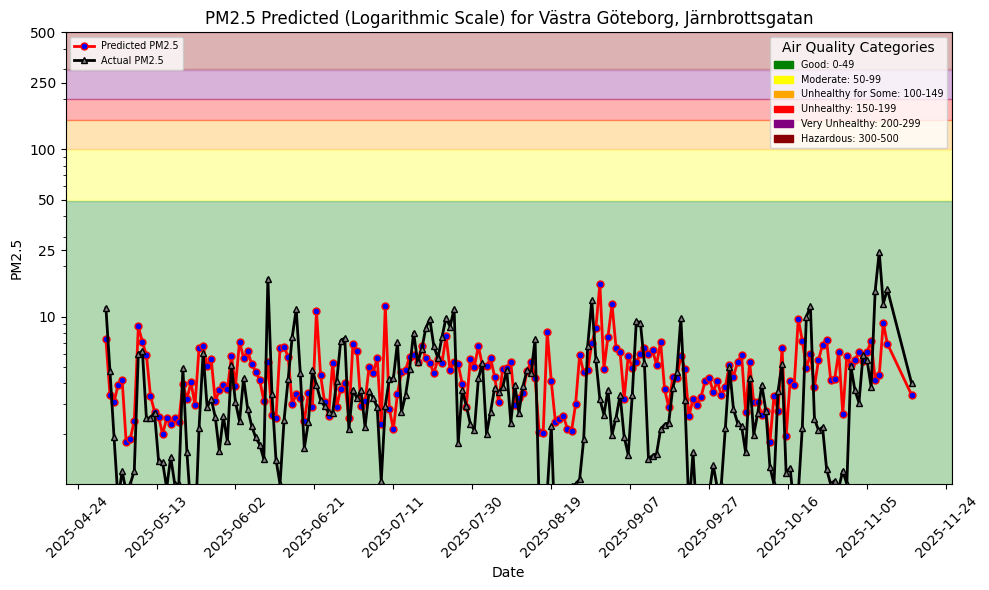

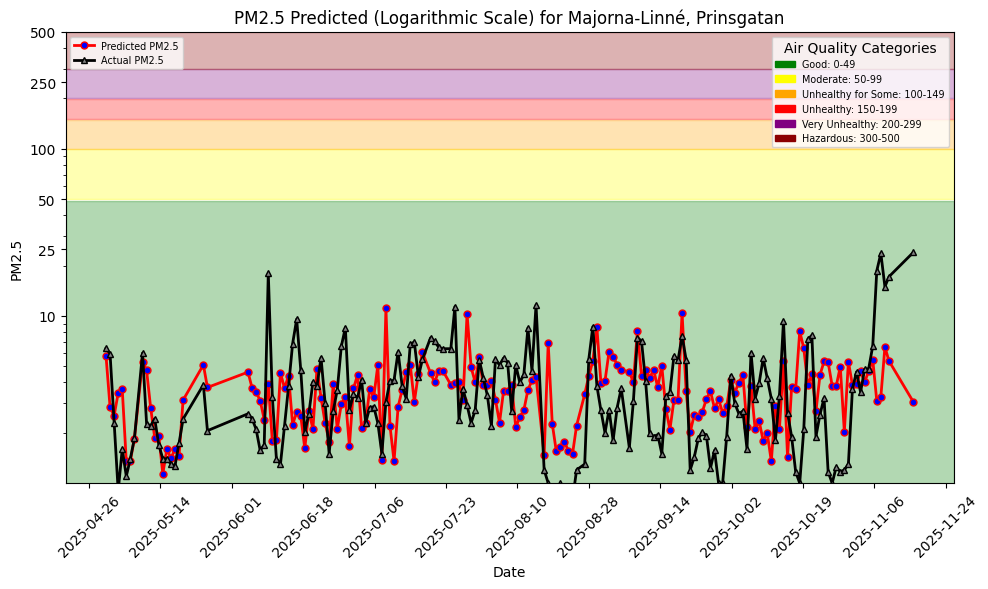

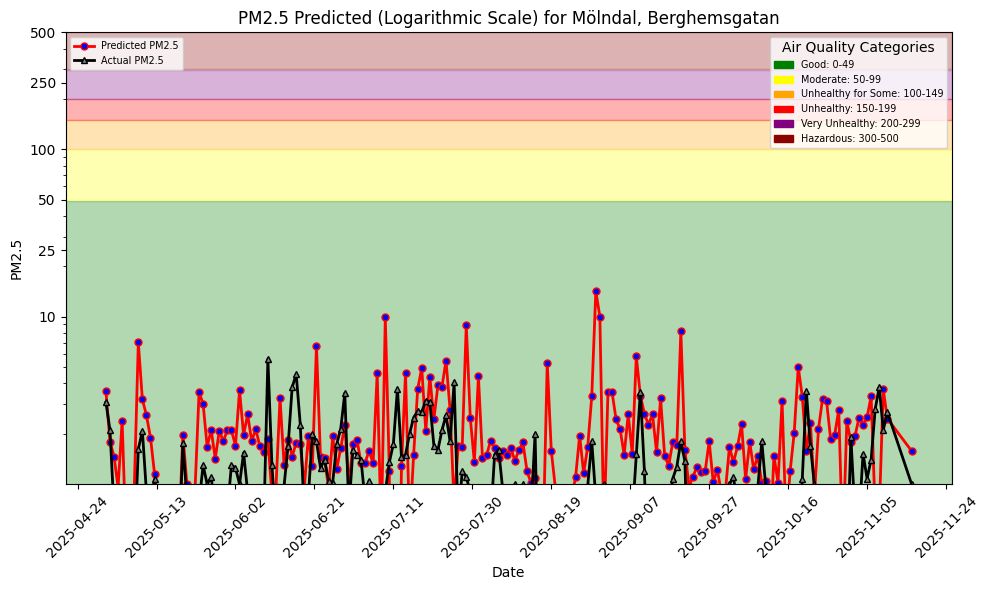

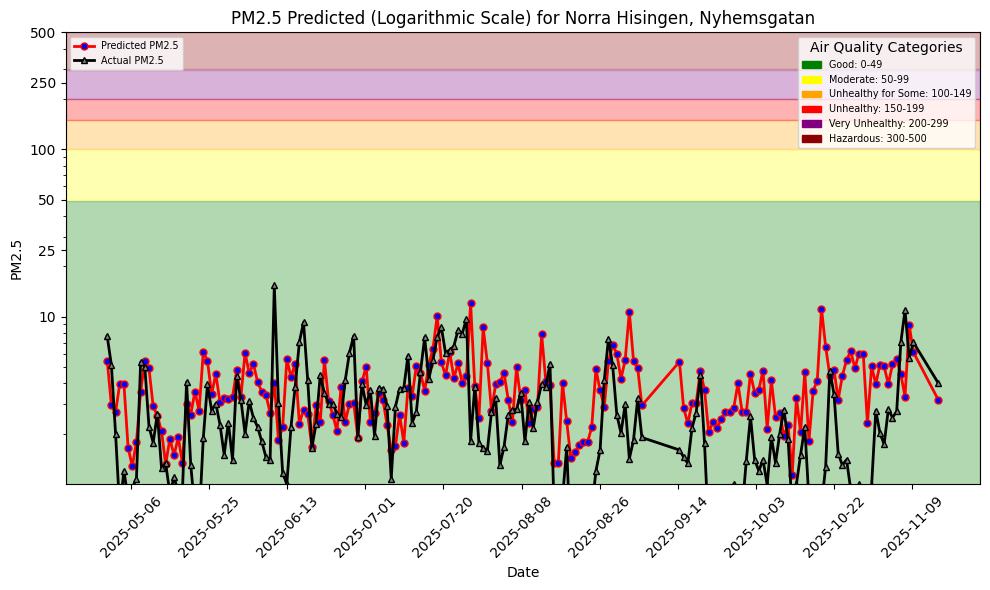

In [16]:
file_paths = []
for i ,(id, location) in enumerate(locations.items()):
    if i > 3:
        break
    city = location["city"]
    street = location["street"]
    latitude = location["latitude"]
    longitude = location["longitude"]
    df_subset = df[df["latitude"] == latitude]
    df_subset = df_subset[df_subset["longitude"] == longitude]
    df_subset = df_subset.sort_values(by=["date"])
    df_subset.drop(["latitude", "longitude"], axis=1, inplace=True)
    file_path = images_dir + f"/pm25_{city}_{street}_hindcast.png"
    plt = util.plot_air_quality_forecast(
        city, street, df_subset, file_path, hindcast=True
    )
    plt.show()
    file_paths.append(file_path)

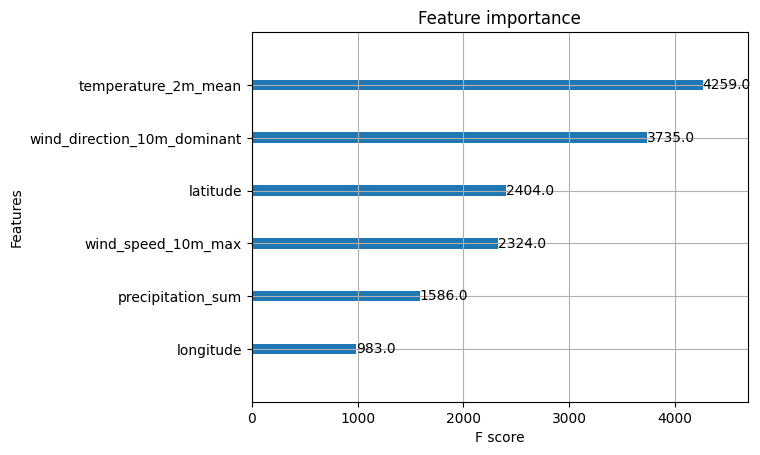

In [17]:
# Plotting feature importances using the plot_importance function from XGBoost
plot_importance(xgb_regressor)
feature_importance_path = images_dir + "/feature_importance.png"
plt.savefig(feature_importance_path)
plt.show()

In [18]:
rolling_features = air_quality_fg.select(["pm25", "pm25_rolling_3d", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
rolling_feature_view = fs.get_or_create_feature_view(
    name="air_quality_rolling_fv",
    description="Weather features, PM2.5 rolling window (3d) for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=rolling_features,
)

lagged_1d_features = air_quality_fg.select(["pm25", "pm25_lag_1d", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
lagged_1d_feature_view = fs.get_or_create_feature_view(
    name="air_quality_lagged_1d_fv",
    description="Weather features, PM2.5 lags (1d) for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=lagged_1d_features,
)

lagged_2d_features = air_quality_fg.select(["pm25", "pm25_lag_1d", "pm25_lag_2d", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
lagged_2d_feature_view = fs.get_or_create_feature_view(
    name="air_quality_lagged_2d_fv",
    description="Weather features, PM2.5 lags (1d, 2d) for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=lagged_2d_features,
)

lagged_3d_features = air_quality_fg.select(["pm25", "pm25_lag_1d", "pm25_lag_2d", "pm25_lag_3d", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
lagged_3d_feature_view = fs.get_or_create_feature_view(
    name="air_quality_lagged_3d_fv",
    description="Weather features, PM2.5 lags (1d, 2d, 3d) for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=lagged_3d_features,
)

complete_features = air_quality_fg.select(["pm25", "pm25_rolling_3d", "pm25_lag_1d", "pm25_lag_2d", "pm25_lag_3d", "date"]).join(
    weather_fg.select_features(), on=["sensor_id"]
)
complete_feature_view = fs.get_or_create_feature_view(
    name="air_quality_complete_fv",
    description="Weather features, PM2.5 rolling window (3d), and PM2.5 lags (1d, 2d, 3d) for PM2.5 prediction",
    version=1,
    labels=["pm25"],
    query=complete_features,
)


2025-11-16 17:14:34,643 INFO: Using ['temperature_2m_mean', 'precipitation_sum', 'wind_speed_10m_max', 'wind_direction_10m_dominant', 'city', 'latitude', 'longitude'] from feature group `weather_all` as features for the query. To include primary key and event time use `select_all`.
Feature view created successfully, explore it at 
https://c.app.hopsworks.ai:443/p/1279179/fs/1265797/fv/air_quality_rolling_fv/version/1
2025-11-16 17:14:39,199 INFO: Using ['temperature_2m_mean', 'precipitation_sum', 'wind_speed_10m_max', 'wind_direction_10m_dominant', 'city', 'latitude', 'longitude'] from feature group `weather_all` as features for the query. To include primary key and event time use `select_all`.
Feature view created successfully, explore it at 
https://c.app.hopsworks.ai:443/p/1279179/fs/1265797/fv/air_quality_lagged_1d_fv/version/1
2025-11-16 17:14:43,494 INFO: Using ['temperature_2m_mean', 'precipitation_sum', 'wind_speed_10m_max', 'wind_direction_10m_dominant', 'city', 'latitude', 'l

In [19]:
def train_test_save_xgboost_model(feature_view, test_start, model_name, model_description):
    X_train, X_test, y_train, y_test = feature_view.train_test_split(test_start=test_start)
    
    X_features = X_train.drop(columns=["date", "city"])
    X_test_features = X_test.drop(columns=["date", "city"])
    
    xgb_regressor = XGBRegressor(
       learning_rate=0.01,
       max_depth=5,
       n_estimators=500
    )
    xgb_regressor.fit(X_features, y_train)
    y_pred = xgb_regressor.predict(X_test_features)

    print(f"\nTesting {model_name}")
    mse = mean_squared_error(y_test.iloc[:, 0], y_pred)
    print(" MSE:", mse)

    r2 = r2_score(y_test.iloc[:, 0], y_pred)
    print(" R squared:", r2)
    df = y_test.copy()
    df["predicted_pm25"] = y_pred

    df[["date", "latitude", "longitude"]] = X_test[["date", "latitude", "longitude"]]
    df = df.sort_values(by=["date"])


    model_dir = f"models/air_quality_{model_name}"
    if not os.path.exists(model_dir):
        os.mkdir(model_dir)
    images_dir = model_dir + "/images"
    if not os.path.exists(images_dir):
        os.mkdir(images_dir)


    for id, location in locations.items():
        city = location["city"]
        street = location["street"]
        latitude = location["latitude"]
        longitude = location["longitude"]
        df_subset = df[df["latitude"] == latitude]
        df_subset = df_subset[df_subset["longitude"] == longitude]
        df_subset = df_subset.sort_values(by=["date"])
        df_subset.drop(["latitude", "longitude"], axis=1, inplace=True)
        file_path = images_dir + f"/pm25_{city}_{street}_hindcast.png"
        plt = util.plot_air_quality_forecast(
            city, street, df_subset, file_path, hindcast=True
        )

    plot_importance(xgb_regressor)
    feature_importance_path = images_dir + "/feature_importance.png"
    plt.savefig(feature_importance_path)

    xgb_regressor.save_model(model_dir + "/model.json")
    
    res_dict = {
        "MSE": str(mse),
        "R squared": str(r2),
    }

    mr = project.get_model_registry()
    aq_model = mr.python.create_model(
        name=f"air_quality_xgboost_{model_name}",
        metrics=res_dict,
        feature_view=feature_view,
        description=model_description,
    )

    aq_model.save(model_dir)
    
    return res_dict

Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (1.93s) 
2025-11-16 17:15:02,323 INFO: Provenance cached data - overwriting last accessed/created training dataset from 1 to 2.

Testing baseline
 MSE: 22.046845293421356
 R squared: -2.3053819246077625


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/model.json: 0.000%|  …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Lindome_H…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Mölndal_B…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Mölndal_E…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Gothenbur…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Västra Gö…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/feature_import…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Lundby_Lo…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Norra His…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Torslanda…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Centrum_D…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Örgryte-H…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Centrum_y…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_baseline/images/pm25_Gothenbur…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/780 elaps…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_baseline/3
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.60s) 

Testing rolling
 MSE: 5.479879776922153
 R squared: 0.17842687592737194


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/model.json: 0.000%|   …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Lindome_Hö…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Mölndal_Be…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Mölndal_Ek…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Gothenburg…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Västra Göt…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/feature_importa…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Majorna-Li…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Lundby_Lon…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Norra Hisi…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Torslanda_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Centrum_Do…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Örgryte-Hä…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Majorna-Li…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Centrum_ys…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Majorna-Li…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_rolling/images/pm25_Gothenburg…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/857 elaps…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_rolling/3
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.53s) 

Testing lagged_1d
 MSE: 4.198283139165529
 R squared: 0.37057075432356457


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/model.json: 0.000%| …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Lindome_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Västra G…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/feature_impor…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Lundby_L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Norra Hi…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Torsland…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Örgryte-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_1d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/853 elaps…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_lagged_1d/2
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.45s) 

Testing lagged_2d
 MSE: 4.2411806119057305
 R squared: 0.36413933390401243


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/model.json: 0.000%| …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Lindome_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Västra G…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/feature_impor…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Lundby_L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Norra Hi…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Torsland…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Örgryte-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_2d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/926 elaps…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_lagged_2d/2
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.96s) 

Testing lagged_3d
 MSE: 4.959436455162491
 R squared: 0.25645454499440723


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/model.json: 0.000%| …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Lindome_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Mölndal_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Västra G…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/feature_impor…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Lundby_L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Norra Hi…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Torsland…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Örgryte-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Centrum_…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Majorna-…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_lagged_3d/images/pm25_Gothenbu…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/999 elaps…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_lagged_3d/2
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (2.58s) 

Testing complete
 MSE: 4.172621867456261
 R squared: 0.37441803054569023


  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/model.json: 0.000%|  …

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Lindome_H…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Mölndal_B…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Mölndal_E…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Gothenbur…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Västra Gö…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/feature_import…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Lundby_Lo…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Norra His…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Torslanda…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Centrum_D…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Örgryte-H…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Centrum_y…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Majorna-L…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/models/air_quality_complete/images/pm25_Gothenbur…

Uploading /Users/max/Repos/KTH/pm25-forecast-openmeteo-aqicn/model_schema.json: 0.000%|          | 0/1076 elap…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1279179/models/air_quality_xgboost_complete/2


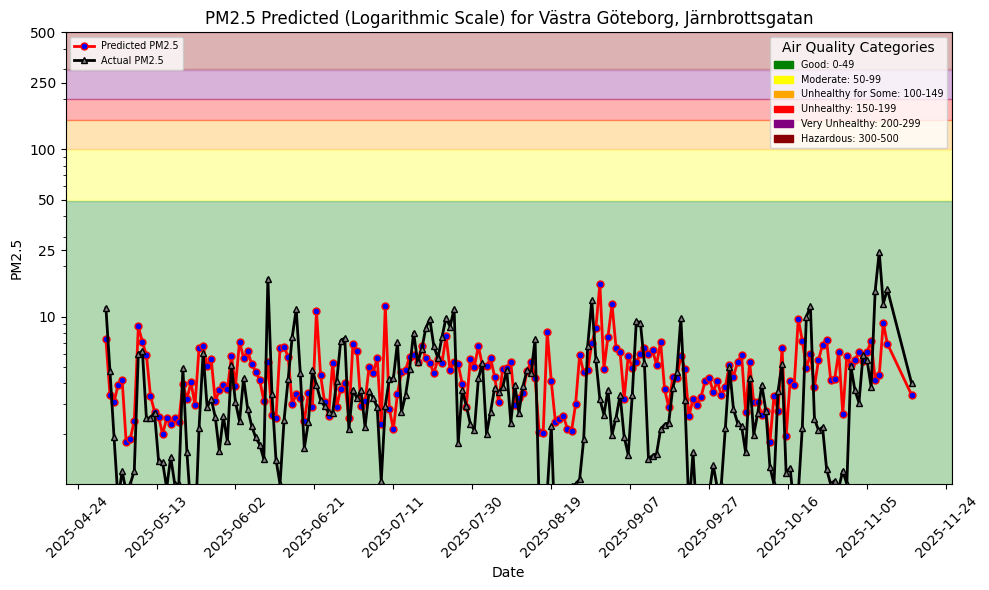

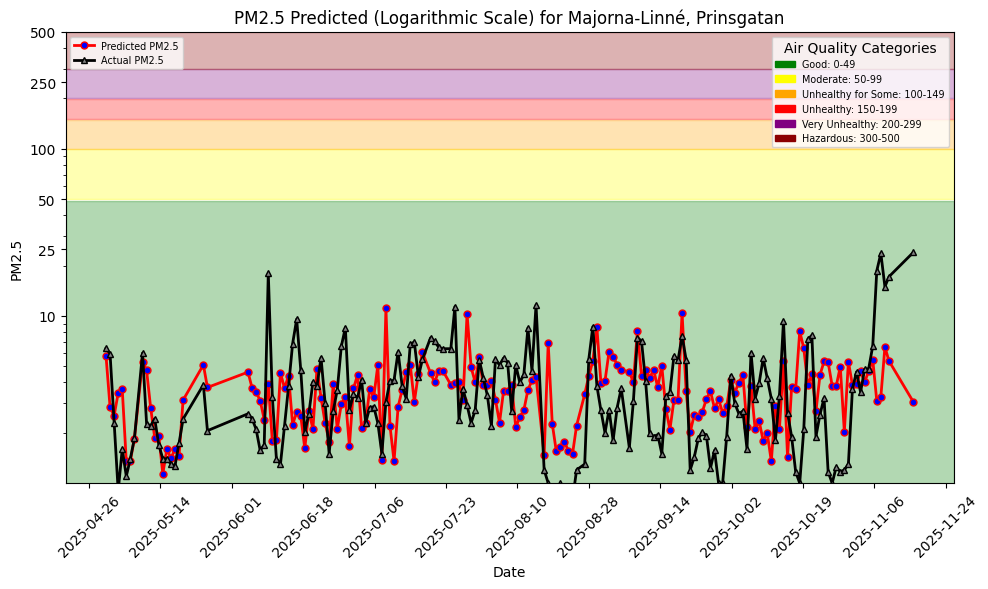

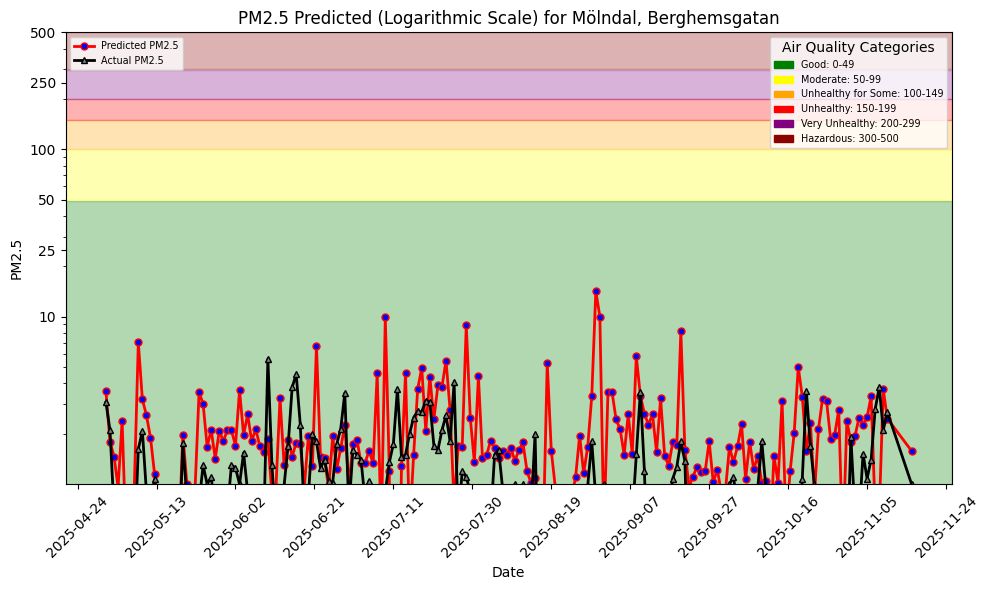

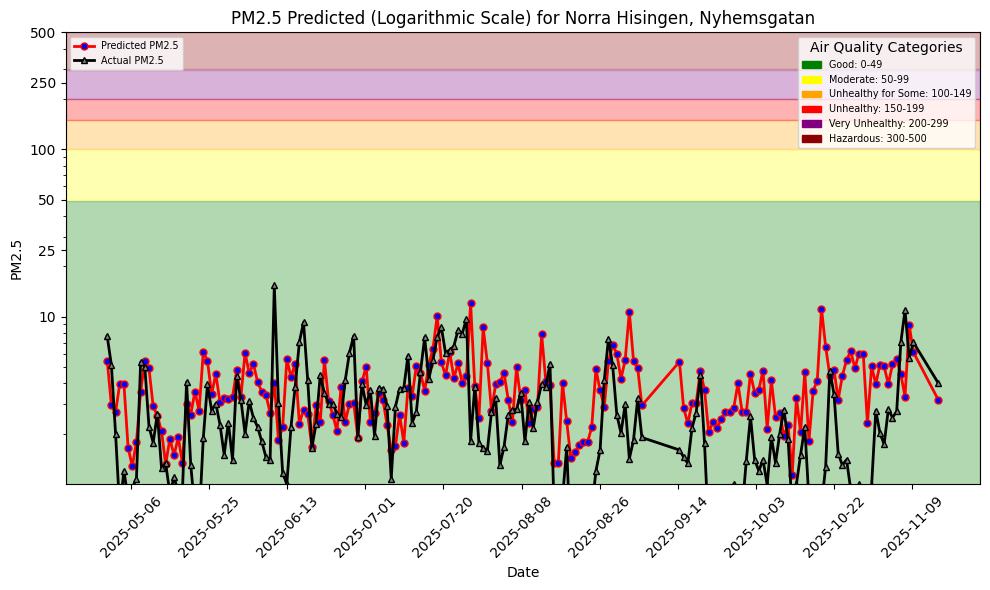

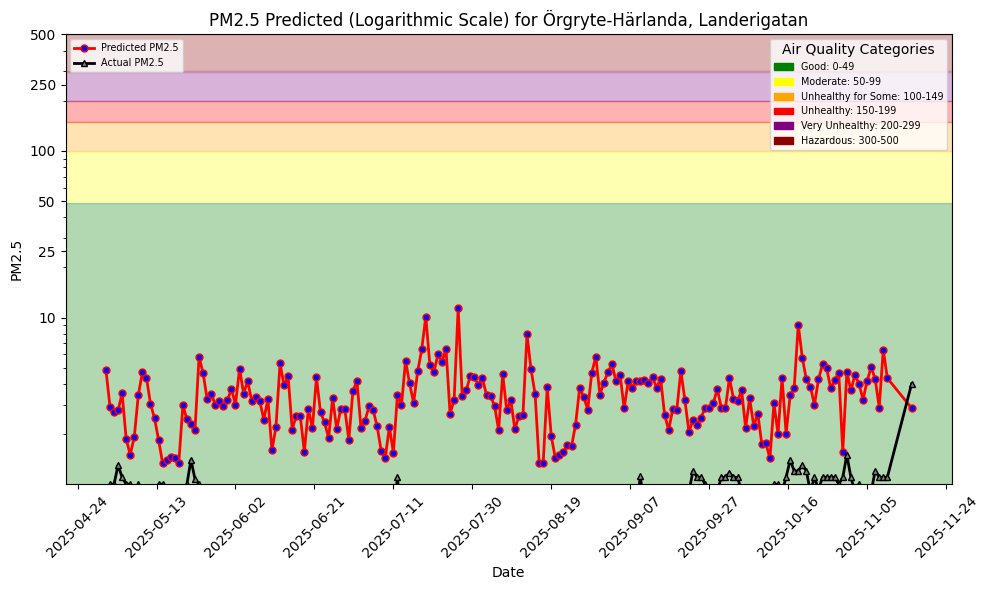

...

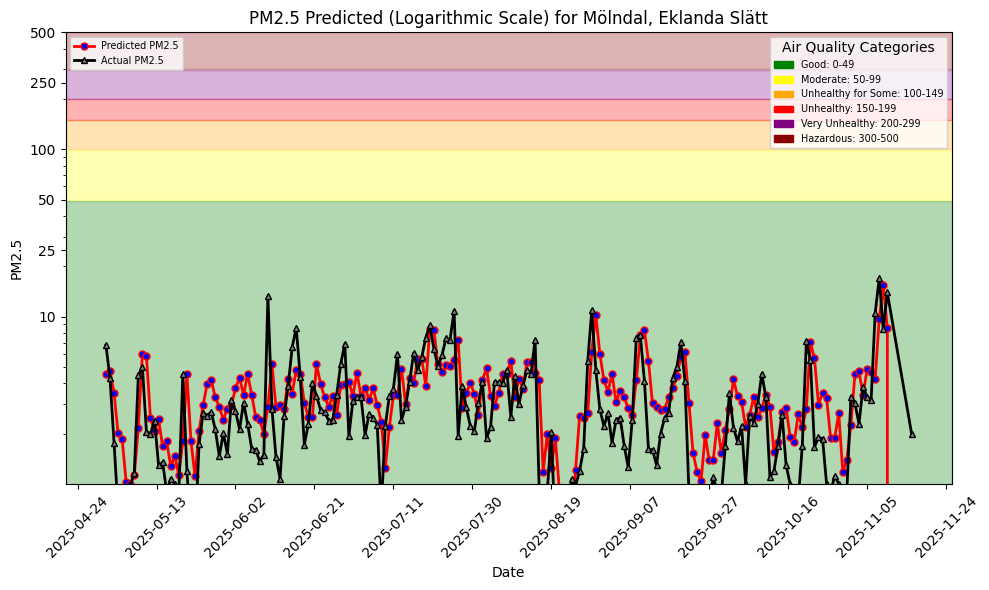

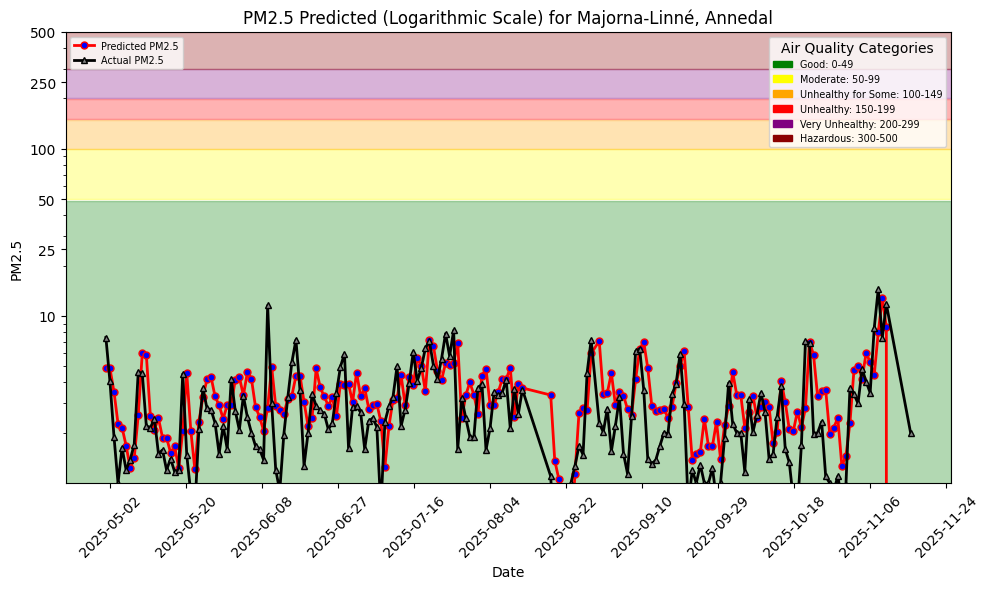

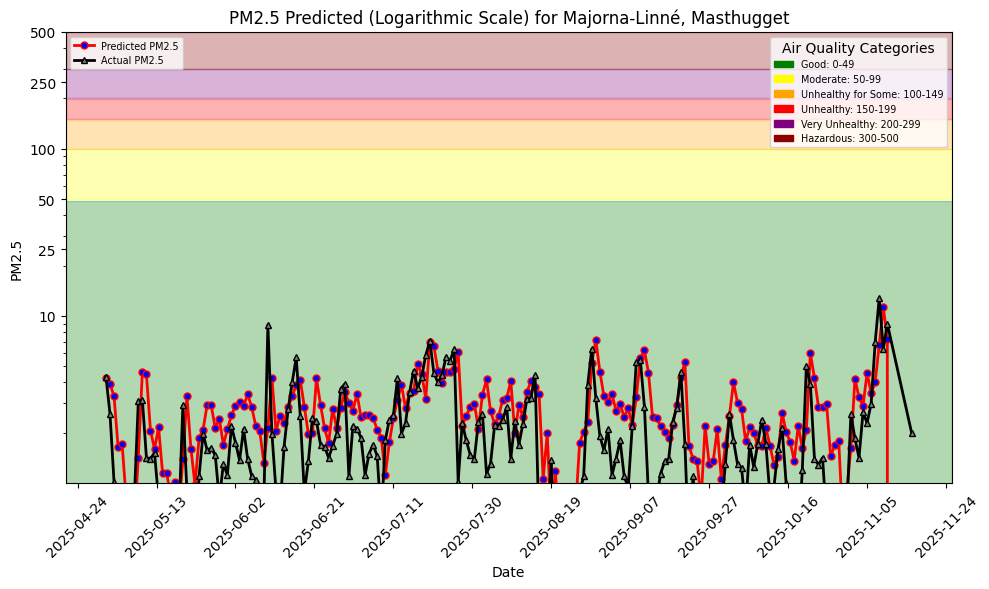

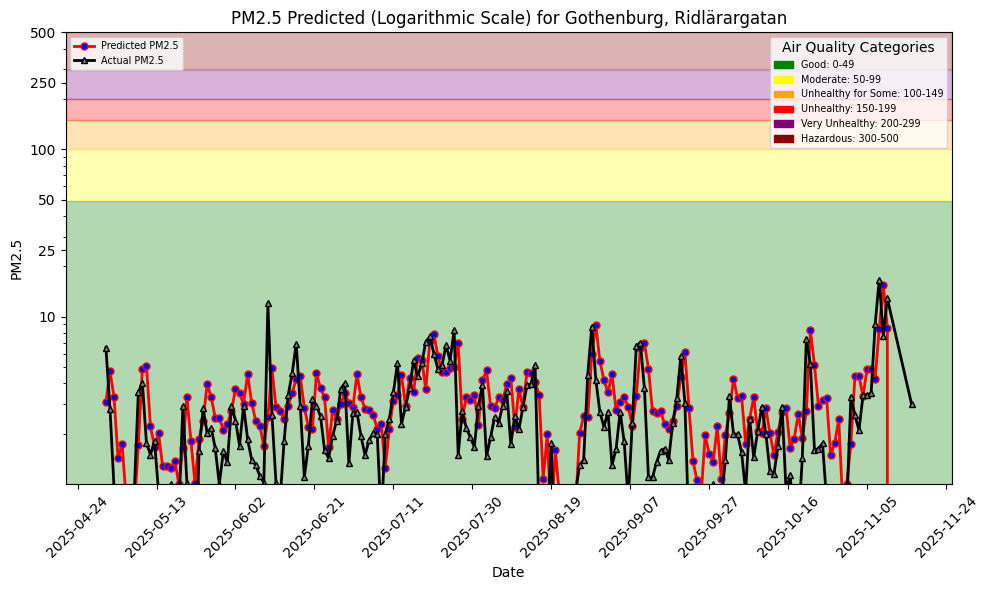

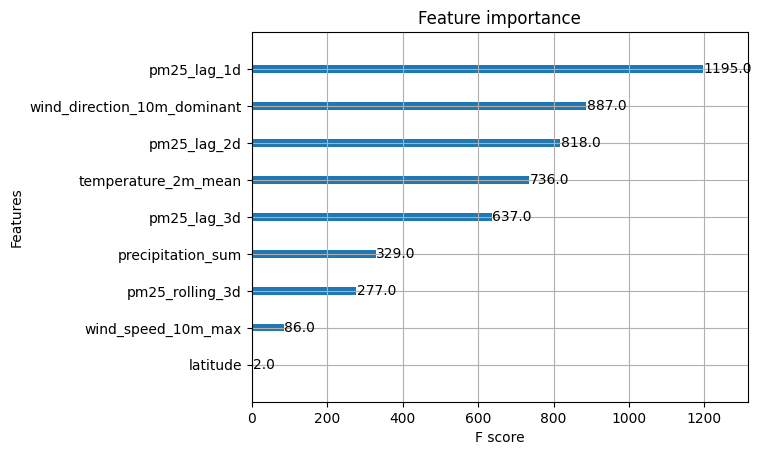

In [20]:
results = {}
results["baseline"] = train_test_save_xgboost_model(baseline_feature_view, test_start, "baseline", "Baseline Air Quality (PM2.5) predictor")
results["rolling"] = train_test_save_xgboost_model(rolling_feature_view, test_start, "rolling", "Air Quality (PM2.5) predictor with rolling window (3d)")
results["lagged_1d"] = train_test_save_xgboost_model(lagged_1d_feature_view, test_start, "lagged_1d", "Air Quality (PM2.5) predictor with lags (1d)")
results["lagged_2d"] = train_test_save_xgboost_model(lagged_2d_feature_view, test_start, "lagged_2d", "Air Quality (PM2.5) predictor with lags (1d, 2d)")
results["lagged_3d"] = train_test_save_xgboost_model(lagged_3d_feature_view, test_start, "lagged_3d", "Air Quality (PM2.5) predictor with lags (1d, 2d, 3d)")
results["complete"] = train_test_save_xgboost_model(complete_feature_view, test_start, "complete", "Air Quality (PM2.5) predictor with rolling window (3d) and lags (1d, 2d, 3d)")

In [21]:
for model_name, model_results in results.items():
    print(f"\n{model_name} results:")
    for metric, value in model_results.items():
        print(f" {metric}: {value}")


baseline results:
 MSE: 22.046845293421356
 R squared: -2.3053819246077625

rolling results:
 MSE: 5.479879776922153
 R squared: 0.17842687592737194

lagged_1d results:
 MSE: 4.198283139165529
 R squared: 0.37057075432356457

lagged_2d results:
 MSE: 4.2411806119057305
 R squared: 0.36413933390401243

lagged_3d results:
 MSE: 4.959436455162491
 R squared: 0.25645454499440723

complete results:
 MSE: 4.172621867456261
 R squared: 0.37441803054569023
